# Image Processing 
## Final Project - Sediment Analysis
### Progress Report 4/22
By Shu-Nong Wu | RIN: 661371234 | RCS: wus7

## 1. Introduction
&emsp;
On campus, there is a robotics team known as Rock Raiders whose mission is to compete in the University Rover Challenge. The team must design, manufacture, test, and deploy a Mars rover-like robot into the Utah desert. A task that the team must complete for competition is the Science Cache Task. For the Science Cache Task, the robot must gather soil samples and return it to base. Once the sample is collected it must be analyzed for evidence of water flow which is a prerequisite life.  From the 2018 science plan:

    “High-resolution photography will provide information on soil grain size. This data will be analyzed by software to construct a histogram of grain sizes to determine the quality of grain sorting based on a statistical formula. If the soil is considered well-sorted, it can be compared to the mean grain size to determine if the soil was finely layered, which suggests presence of water in the past. The observation of rounded pebbles and gravel fragments in the microscopic images could also indicate the presence of flowing water. By observing the sediments of the soil sample, information about the depositional environment of the site can be drawn.”

The plan is to use a high resolution camera to identify soil grains and pebbles that show evidence of water flow.

    “If sediments are well sorted, pore spaces are uniformly sized, thereby allowing for groundwater flow readily between individual sediment particles. If sediments are poorly sorted, pore spaces are filled with smaller sediments, thereby reducing the movement of water through the deposits. These deposits will supply lower volumes of ground water.” [9]

The result will be a histogram of relative pebble size and roundness.

&emsp;
The University Rover Challenge presents many challenges a real Mars rover would face. A key objective for Mars missions is to find evidence of water as a sustainable water supply will greatly aid a successful colonization of Mars. The Martian soil is rich with clues about the history of the Red Planet and its terrain. The clues can be extracted using image processing and can aid scientists in their analysis of Martial geology.

&emsp;
Equipment that is needed includes a high resolution digital camera which the robotics team will provide and soil sample from the Utah which was already obtained. For preparing the sample a sieve will be used to physically isolate pebbles from large chunks of rock. More detail on how this equipment was used will be detailed in later sections.

## 2. Related Work
&emsp;
There exists a wide variety of resources and work related to this project. Applications of grain size estimation exist in marine geology where grain size analysis is used to determine the flow of sediment in intertidal areas **[5].** Although nanoparticles are not the same as soil grains, determining the size and shape of nanoparticles is a widely explored subject in the manufacturing of ceramics, cosmetics, and plastics **[4].** Other applications include construction as "(The size of cement particles) have a large influence on hydration kinetics, microstructure development, and ultimate properties of cement-based materials" **[6].** Many the journals that explore applications of grain size estimation do not explain the actual algorithms that goes into actually finding grain size. Rather they start with the grain size already found and discuss the implications of this data. However, this does demonstrate that this project topic is a popular in industry and subsequently academia. This suggests that there exists extensive work done in the development of algorithms that estimate soil grain size.

&emsp;
Due to the wide applications of this project there exist many commercially made products that can either perform or at least aid the finding soil grain size. The first of which is MagniSci **[1]** which is software application that can perform complex segmentation on an image to find the properties of particles. The product has several demonstration videos where they show particle size analysis and measure the properties of particles in a given space and generate a report of particle sizes as well as other information. Although this product has a very comprehensive implementation of particle size analysis it is proprietary and therefore their algorithm is off limits. Therefore it is not feasible to use this as resource for this project. On the other hand, the product does show what is possible and how far this project can go. Other software such as MIPAR **[2]** and FIJI **[3]** are image processing software that can assist in the estimating particle size. These software provide GUIs for implementing image processing operations. The algorithm still need to be chosen by the user.


&emsp;
There also exists many journal articles, theses, and dissertations related to analyzing soil grain size. For example, a master’s thesis "Soil Characterization Using Digital Image Processing" by Kshitija S. Naphade of Lehigh University **[7]** used many concepts learned in class such as image enhancement, filtering, region splitting and merging, watershed, second derivative operations, and Hough transforms to identify soil grains. A dissertation, "IMAGE-BASED SOIL PARTICLE SIZE AND SHAPE CHARACTERIZATION" by Hyon-Sohk Ohm from University of Michigan **[8]** had a similar general approach. However he explored many more advanced segmentation techniques such as k-means clustering and mean-shift clustering.

&emsp;
This project also ties into what was learned in class. Many key concepts starting from converting from one color space to another, filtering, thresholding, morphological transforms, image segmentation, and shapes to object are all topics widely explore in class. As a result many of the class lectures and notes were helpful in the implementation of this project. In addition, the homeworks provided good practice when it came to implementation of the concepts learned in class.

#### Import Dependencies

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from gen_utils import *
from ip_utils import *
from IPython.display import Image

## 3. Data Collection
### Collecting Soil Samples
&emsp;
Shown below raw soil sample images that were gathered by a high resolution microscope. The resolution of these images are 1600x1200. Some concern include:

- Images in the same sample have significantly different color. This is due to the fact that the camera has two zoom settings, 30x and 150x. The two zoom settings result in different colors. 
- Differences in light intensity results in images with slightly different hue. 
- There is quite a bit of unwanted debris/dust in the sample as well. This project is primarily interested in the pebbles so random dust/grains is of interest. 
- Some pebbles overlap and obstruct one another which will lead to inaccurate measurements of area.

Therefore the soil sample in its raw unprocessed state is difficult to segment and find pebbles.

&emsp;
Currently only the soil from the soil collected from Utah was used for analysis. This is because it is both a challenging sample to work with and would provide a good "stress test" for the grain size analysis algorithm. Additionally, because the competition is being held in Utah, this sample is the most accurate representation of what a soil sample will be like during the competition.

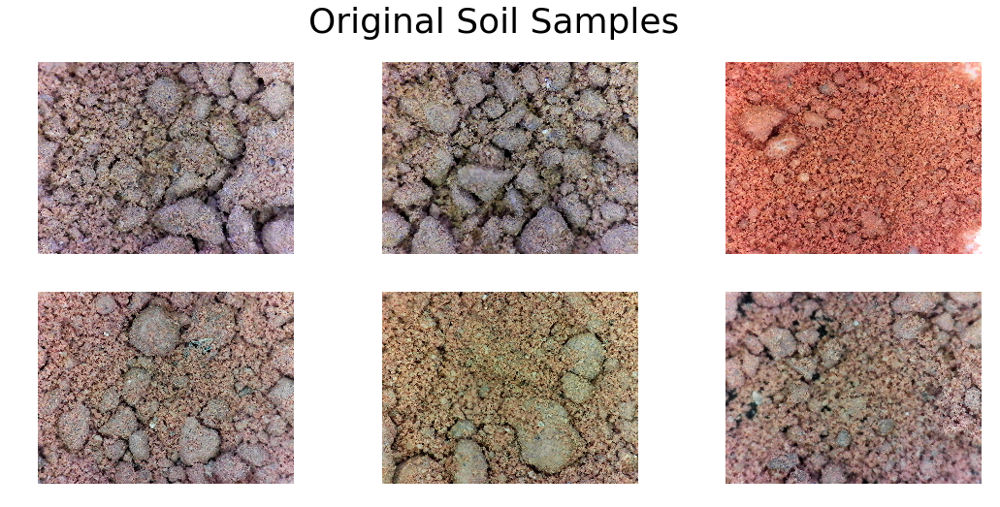

In [2]:
set1_bgr = [sample for sample in load_imgs_from_folder('Set1')]
set1_rgb = cvt_color(set1_bgr, cv2.COLOR_BGR2RGB)
set1_hsv = cvt_color(set1_bgr, cv2.COLOR_BGR2HSV)
set1_grey = cvt_color(set1_bgr, cv2.COLOR_BGR2GRAY)
display_imgs(set1_rgb, width=3, height=2, title='Original Soil Samples')

### Physically Prepare Samples
&emsp;
If a problem is presented well, the solution is trivia. As mentioned in the previous section, performing image processing on raw samples is not ideal. The problem can be presented better by both flattening the sample and placing it against a background that can be easily distinguished from the soil samples color wise. For ease of implementation, tape was used to get a flat layer of sample such that pebbles don’t overlap and a sufficiently spaced out. This was done by first spreading the soil out on a flat surface. A piece of tape is then pressed against the sample and a layer of soil gets stuck onto the tape. So far two different types of tape were used, packaging tape and 3M VHB tape. Packaging tape yield poor results as the adhesive was not very strong. Shown below, the packaging tape was only able to pick up the dusty parts of the sample rather than the larger pebbles. 3M VHB tape was used instead as it is much stickier than packaging tape. Plus the tape a quite spongy and can be pressed down onto the sample and capture more of the sample while still keeping the soil flat. As one can see from the images below the soil sample with 3M VHB tape is a huge improvement over the raw images as pebbles no longer overlap and contrasts with the black tape.

### Take Images of Samples
&emsp;
The goal of this project is to compare the relative sizes of pebbles in the soil. Given two pebbles of the same size, if one images is taken close to the pebble it will falsely appear to be larger. Therefore, when collecting images of the sample the camera must be mounted on the same height above the sample for all the images.

In [1]:
set2_bgr = [sample for sample in load_imgs_from_folder('Set2')]
set2_rgb = cvt_color(set2_bgr, cv2.COLOR_BGR2RGB)
set2_hsv = cvt_color(set2_bgr, cv2.COLOR_BGR2HSV)
set2_grey = cvt_color(set2_bgr, cv2.COLOR_BGR2GRAY)
display_imgs(set2_rgb, width=3, height=2, title='Prepared Sample: Packaging Tape')

NameError: name 'load_imgs_from_folder' is not defined

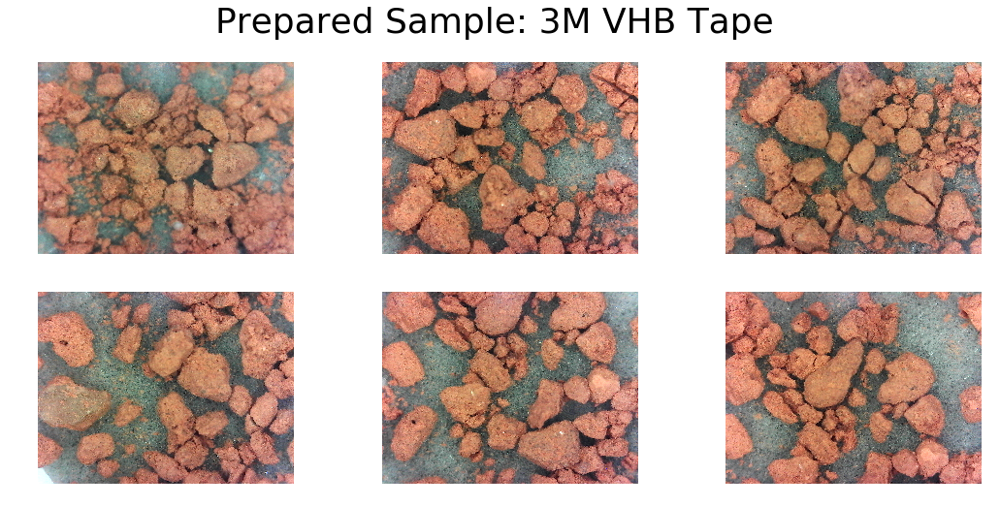

In [4]:
set3_bgr = [sample for sample in load_imgs_from_folder('Set3')]
set3_rgb = cvt_color(set3_bgr, cv2.COLOR_BGR2RGB)
set3_hsv = cvt_color(set3_bgr, cv2.COLOR_BGR2HSV)
set3_gray = cvt_color(set3_bgr, cv2.COLOR_BGR2GRAY)
display_imgs(set3_rgb, width=3, height=2, title='Prepared Sample: 3M VHB Tape')

## 4. Technical Approach
<img src="Report/flowchart.jpg">

&emsp;
The workflow on how to implement this project is shown above. Some of these steps were initially implemented but removed for the time being. The reason for these removals will be discussed in the intermediate results section.
1. Collect Soil Samples: Soil ought to represent that of the Utah desert
2. Physically Prepare Samples: Use tape to get a layer of soil for ease of analysis (see previous section)
    - Packaging tape
    - 3M VHB tape
3. Take Images of Samples: Take images of samples using high resolution digital microscope
4. Convert to Images to Grayscale: This project uses Otsu thresholding which works best in grayscale
5. Denoise: To remove noise
    - Median filtering
        - **Median Filter Kernel Size = 11**.
    - Gaussian filtering (not implemented)
        - **Gaussian Filter Kernel Size = 0**
        - **Gaussian Filter Sigma = 0**
6. Threshold: To separate pebbles from background
    - Otsu Thresholding
7. Morphological Transformations: Remove noise and separates out the pebbles from one another
    - Closing (not implemented)
        - **Closing Kernel Size = 0**
        - **Number Closing Iteration = 0**
    - Erosion
        - **Erosion Kernel Size = 5**
        - **Number Erosion Iteration = 5**
8. Segmentation: Segment the image such that pebbles get separated out from one another
    - Approach 1: Finding Contours
    - Approach 2: Watershed
9. Fit Ellipses Around Pebbles: Fit an ellipse around watershed segments for later analysis
10. Find Size and Shape of Pebbles: Calculate area and eccentricity of ellipses
11. Plot Histogram of Pebble Size and Shape: Generate plots for later analysis
12. Analyze Data: Compare histograms and determine evidence of water flow

The software configuration that is being used is python, opencv, and matplotlib.

### Steps 1-3. Data Collection
&emsp;
Steps 1 to 3 focus on gathering and preparing the samples in order to create datasets. The datasets ought to be close up images of the sample. Images should all be taken from the same heights above the sample. Additionally the need to be spread out to ensure that the algorithm can segment the images properly. Full detail on how to implement steps 1 to 3 are explained in section 3, data collection.

### Step 4. Convert Images to Grayscale
&emsp;
The image is originally in BGR color space (default for opencv) and needs to be converted into grayscale. The sample images need to be in grayscale because the hue of the sample vary a lot. However the intensity of the pebbles are relatively consistent and has a high contrast relative to the background making them easier to detect.

### Step 5. Denoise
&emsp;
First the images were blurred to reduce noise. There are two types of blurring being performed, median filtering and Gaussian filtering.

#### Median Filtering
&emsp;
The camera used to gather these images was both incredibly high resolution and of average quality. Therefore is one was to observe carefully the images will have a grainy white dots. Therefore the first kind of filtering that was used is median filtering. Median filtering is ideal for salt and pepper noise. Median filtering is done by convolving a kernel of size $kxk$ over an image. As the kernel is being convolved, the intensity of the middle pixel is being set to the median of the values within the kernel.

#### Gaussian Filtering
&emsp;
Gaussian filtering was used to remove excess Gaussian noise. The texture of the pebbles are not perfectly uniform therefore it must be smoothed out in order to destroy unwanted textures and features that might confuse the algorithm. In addition, Gaussian filters preserves the edges of the pebbles better that average filtering which is important for this application. For Gaussian filter, given an kernel size of $kxk$ and a standard deviation of $\sigma$, the value within each element of the kernel follows the equation

$$
h(x,y) = \frac{1}{2\pi\sigma^2}e^{-\frac{x^2+y^2}{2\sigma^2}}
$$

The kernel gets convolved over the image.

### Step 6. Threshold
&emsp;
First the image must be thresholded in order separate the pebbles from the background. The background and the area between each pebble of will be dark while the pebbles will be bright. Know this, a threshold can be selected that isolates the pebbles and generate a mask. This mask will later be used for segmentation.

&emsp;
As mentioned in the data collection section, the sample images vary in hue quite a bit therefore using a simple manually selected threshold will not work. Manually selecting threshold values is a time consuming process that requires a lot of guess and checks. This is because it is difficult to find a global threshold that encompasses all images in a dataset. Therefore a more dynamic method of thresholding both save time yield better results.

Otsu Thresholding
&emsp;
After attempting simple thresholding in hue, saturation, value (HSV) color space, adaptive filtering, and Otsu thresholding it was determined that Otsu thresholding worked the best. When a threshold is selected it separates the image between foreground and background (in this case pebbles or background). Otsu thresholding involve iterating over all threshold values and selecting a threshold value that minimizes the variance within the each class, foreground and background. Alternatively it can be seen as maximizing the variance across classes. The pseudo code is show below

    setup initial max_variance and mean for each class
    for threshold in range(max_intensity)
        calculate variance across foreground and background
        update max_variance and mean for each class
    return threshold with max fg,bg variance

### Step 7. Morphological Transformations
&emsp;
Two fundamental morphological operation performed includes erosion and dilation. Erosion essentially erodes away the structure of a binary mask making it "skinnier". Dilation is the opposite of erosion in which the structure is dilated or puffed up to appear "fatter". 

#### Closing
&emsp;
First the mask is closed in order to get rid of small noisy bits of negative mask. Closing an image is the same as a dilation followed by an erosion.

$$
A\circ B = (A\ominus B)\oplus  B
$$

#### Erosion
&emsp;
Once the image has been thresholded the background and area between each pebble are thresholded out. However there still exists small bridges between two pebbles if they are close enough to one another. These bridges will eventually cause problems during image segmentation two pebbles might be mistaken for one giant pebble. Erosion fixes these issue by eroding away the small bridges between two pebbles making them easier to distinguish from one another.
    
### Step 8. Segmentation
&emsp;
One of the most challenging part of this project is selecting an algorithm that would correctly identify each individual pebble without merging several pebbles together. Two approaches were used fitting contours around an object and watershed algorithm. 

#### Approach 1: Finding Contours
&emsp;
The first approach was to find contours around by connecting all points along the edge of a boundary. The opencv implementation for finding contours involves following the edge of a structure. Full implementation can be found in the article "Topological structural analysis of digitized binary images by border following" by Satoshi Suzuki in the journal Computer Vision, Graphics, and Image Processing. Contours will be found around each pebble.

#### Approach 2: Watershed
&emsp;
The second approach was to use the Watershed algorithm to perform image segmentation. An intuitive way of thinking about the Watershed algorithm is to

    - Imagine an image as a surface where higher the intensity the higher the peak.
    - Different colors of water begin to fill different areas of this surface.
    - These water sources will be referred to as markers. 
    - As the different color water begin to fill this surface some water of different colors begin to merge.
    - As they begin to merge damns get placed in between them such that two water colors never mix.
    - Water keeps on getting filled until every area of the image gets "flooded".
    - The result is a surface with each area filled with a different color water.
    - Each different color water represents a different segment in the image.

This is the theory behind the Watershed algorithm. To implement the Watershed algorithm 

    - There needs to be markers and the original grayscale image.
    - The first step is to find the markers
        - A good place to start is to find places where the confidence that a pebble exists is high. 
        - This is already provided by the previous step.
    - The markers are then labeled. Each connected component receives it own label.
    - Assign a unique label to the background which also provided by the previous step
    - These labeled markers and the image are passed to opencv's built-in Watershed function.

The function returns the new markers after that have now "filled" the image each one having it own labeling. 

### Step 9. Fit Ellipses Around Pebbles
&emsp;
Once the image has been properly segmented, an ellipse fit around each segment. Opencv uses the implementation specified in the paper "A Buyer's Guide to Conic Fitting" **[12]** by Andrew W. Fitzgibbon and Robert B. Fisher from Edinburgh University. More specifically opencv implements the first algorithm in the paper known as **LIN: Algebraic Distance
** where given 2D data points

$$
P=\{X_i\}_{i=1}^n,\ where\ X_i=\{x_i,y_i\}
$$

A family of curves $C(a)$ are parameterized by the vector $a$. Distance matrix $\delta(C(a),X)$ measures the distance from a point $x$ to the curve $C(a)$. The error function is defined as $\epsilon^2(a) = \sum^n_{i=1}\delta(C(a),X_i)$. It is assumed that the curves follows the form $C(a)=\{X|F(a;X)=0\}$ and $F(a;X)=A_{xx}x^2+A_{xy}xy+A_{yy}y^2+A_x x+A_y y+A_0$.The goal is to minimizes the objective function

$$
\epsilon^2(a) = \sum^n_{i=1}F(a,X_i)^2=||Da||^2
$$

Full implementation on how to minimize the objective function is specified in the paper. For the purposes of this project, fitting an ellipse to segments is of interest because the next step is to find the shape and size of these ellipses which have been fit around pebbles.

### Step 10. Find Size and Shape of Pebbles
&emsp;
Given an ellipse with a major axis length $M1$ (longest line that can be fit across and ellipse) and minor axis $M2$ (shortest line that can be fit across an ellipse) the area can be calculated as 

$$
A = \frac{\pi}{4}M1\cdot M2
$$

The eccentricity or circularity of the ellipse can be calculated as 

$$
Eccentricity=\sqrt{1-\frac{M1}{M2}}
$$

where an eccentricity of 0 suggests that the pebble is perfectly circular and eccentricity approaching 1 suggests the it is incredibly non circular.

### Step 11. Plot Histogram of Pebble Size and Shape
&emsp;
Once the areas and eccentricity of each pebble is calculated across all the images in the dataset, a histogram can be plotted using matplotlib pyplot. These histograms show the distribution of pebble size and shape which give valuable information about the soil.

### Step 12. Analyze Data
&emsp;
The purpose of finding pebbles in a soil sample and creating histograms of pebble size and shape is to determine if there is evidence of water flow. Soil with round and well sorted pebbles suggests that water has flowed through the soil in the past. By calculating the eccentricity, the roundness of all the pebbles can be compare to one another. If there are many round pebbles then there is a strong case the area where the sample was collect either has or had water. Figuring out how well sorted the pebbles are can be done by calculating the standard deviation of pebble size. Soil samples with pebbles that are similar in size suggests the presence of water as water flow will gradually erode the pebbles down to a similar size.

## 5. Intermediate Results
### Denoise
#### Median Filtering
Without median filtering there use to exist a lot of salt and pepper noise. As explained earlier, the digital microscope had a lot of salt and pepper noise. Therefore it was very necessary to apply median filtering.

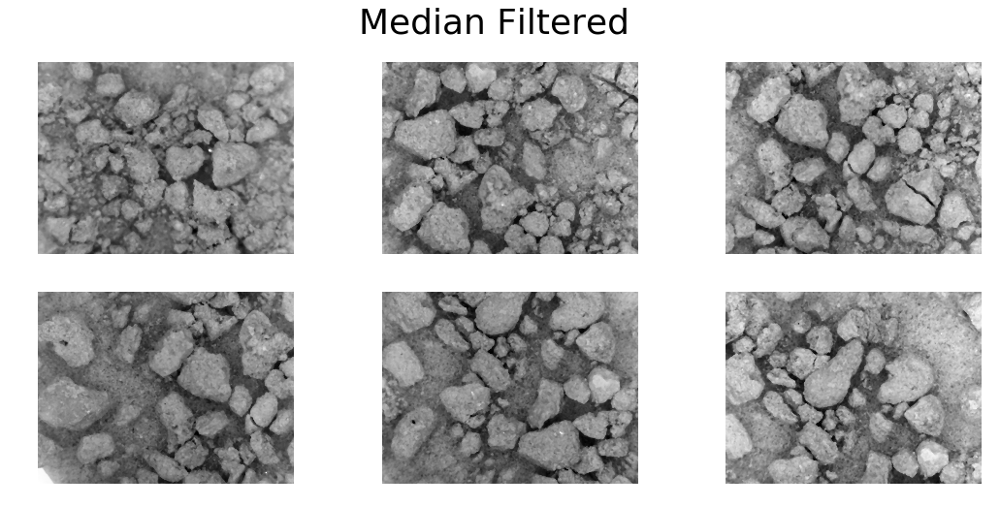

In [5]:
set3_gray_blur = blur(set3_gray, 'median', ksize=11)
display_imgs(set3_gray_blur, width=3, height=2, title='Median Filtered')

#### Gaussian Filtering
Initially, Gaussian filtering was use to smooth out the texture of the pebbles. However there exists some bright spots on the background that ended up getting smeared causing them to merge into the surrounding pebbles. Ultimately, Gaussian filtering exacerbated problems caused by false positives by having those false positives absorb the surrounding pebbles.

In [6]:
# set3_gray_blur = blur(set3_gray_blur, 'gaussian', ksize=11, sigma=5)
# display_imgs(set3_gray_blur, width=3, height=1, title='Gaussian Filtered')

### Threshold
#### Otsu Thresholding
Otsu thresholding is a very convenient solution as there is no need for manual tuning of parameters. In addition it is able to distinguish what is a pebble and what is not to a fairly high degree of accuracy. However, due to the fact the Otsu thresholding is reliant on intensity to distinguish between pebbles and backgrounds there does exist some false positives in area where the background is bright. This can be seen in the bottom right image there the top right corner of the image has a reflection on the tape. Otsu mistakenly assumes that this reflection is a pebble. More details on ways to mitigate this problem will be discussed in the future works section.

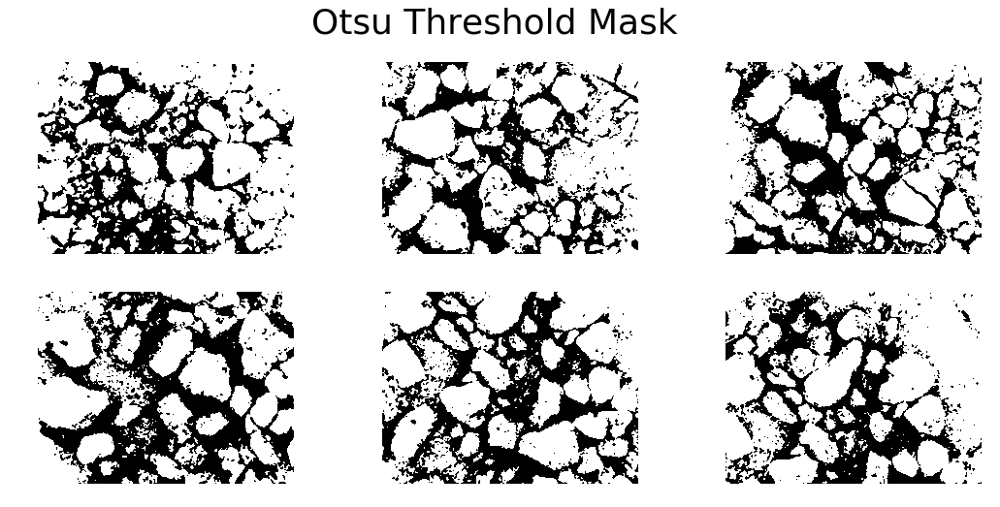

In [7]:
set3_gray_mask = otsu_thresh(set3_gray_blur)
display_imgs(set3_gray_mask, width=3, height=2, title='Otsu Threshold Mask')

### Morphological Transforms
#### Opening
Originally the masks generated from thresholding was open to remove noise. However there exists some problems with opening an image in the presence of large false positive regions caused by Otsu thresholding. As mentioned in the previously, Otsu thresholding confuses reflections as false positives thus causing large positive patches in the threshold mask. After opening these large false positives begin to swallow up the pebbles around it and merging into them. It is for this reason why until these reflections are removed an opening operation will not be performed on the mask.

In [8]:
# set3_gray_mask = morph_tf(set3_gray_mask, 'open', 5, 5)
# display_imgs(set3_gray_mask, width=3, height=2, title='Open Mask')

#### Eroding
Erosion was incredibly effective at both removing noise and isolating pebbles from one another. Small patches of noise get eroded away. In addition the small gaps between each pebble become larger therefore mitigating the problem of two pebbles over lapping. As explained in earlier section if two pebbles are very close to one another and then the image is thresholded there exist a small bridge of positive mask connecting their bodies. This is a problem because the algorithm will mistake two small rounder pebbles for a single larger and oval like one. Eroding handles all of these problems. 

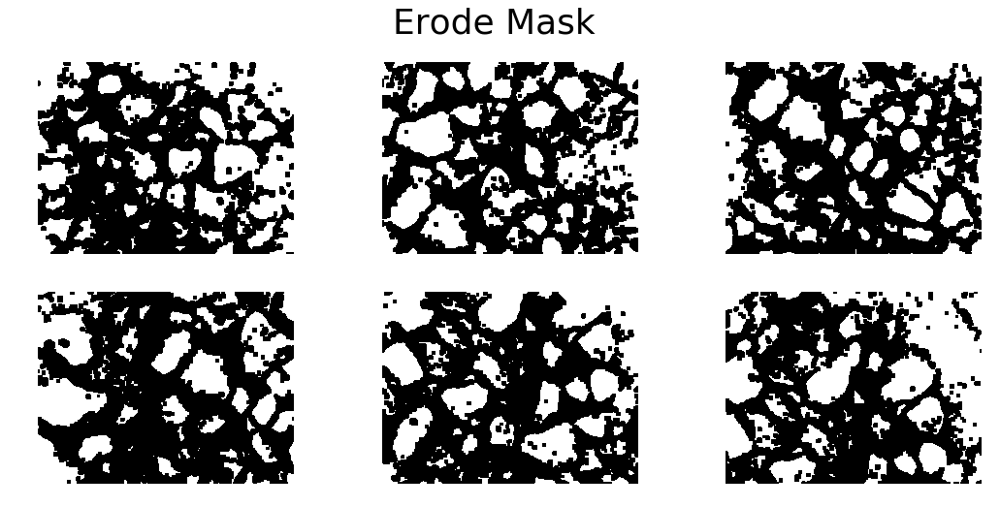

In [9]:
set3_gray_mask = morph_tf(set3_gray_mask, 'erode', 5, 5)
display_imgs(set3_gray_mask, width=3, height=2, title='Erode Mask')

### Mask w/ Original Image
For the purposes of visualization, the mask is overlaid with the original RGB image to get a sense of what is being thresholded and what isn't. As explained earlier, the false positives in the areas where is tape is reflecting is easily visible and is a not dismissible problem.

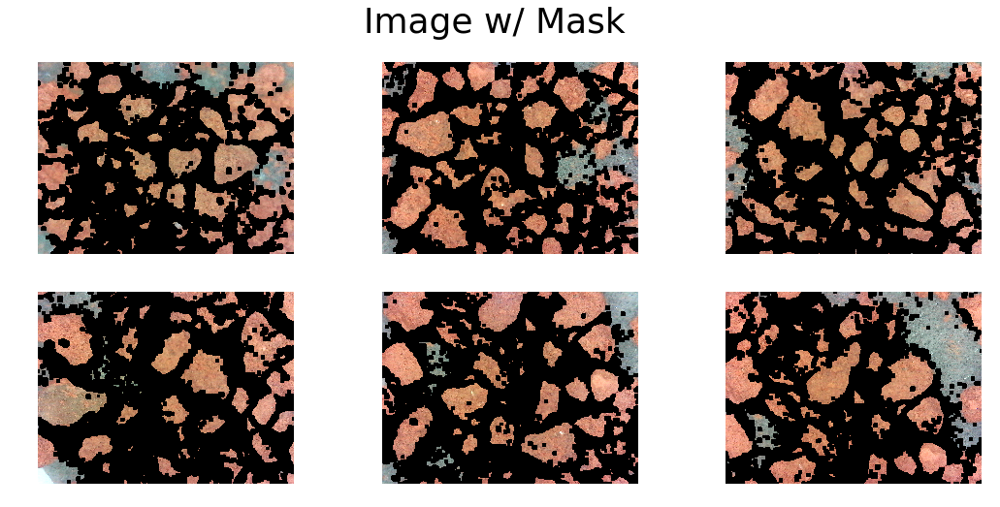

In [10]:
set3_rgb_masked_gray = apply_mask(set3_rgb,set3_gray_mask) 
display_imgs(set3_rgb_masked_gray, width=3, height=2, title='Image w/ Mask')

### Segmentation
#### Approach 1: Finding Contours
Drawing contours around objects in the binary mask produced surprisingly good results but there are several drawbacks. Finding contours resulted in fairly accurate identification of pebbles in this case, it relies too heavily on the morphological transforms to do its job properly. More specifically the binary mask must be eroded just the right amount. Too much erosion will result in an inaccurate estimation of pebble size and shape. Conversely, not enough erosion will cause some contours to be drawn around more than one pebble.

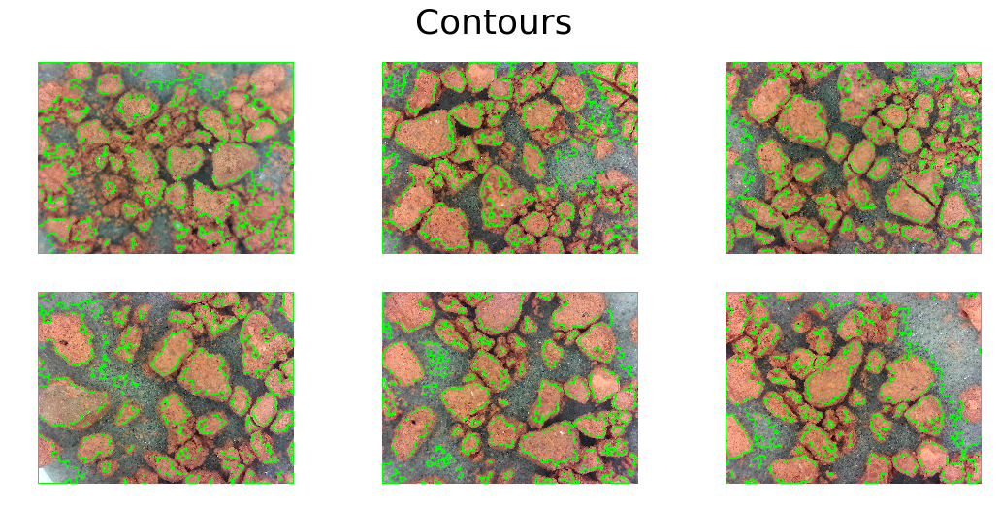

In [11]:
set3_rgb_cnts = copy_imgs(set3_rgb)
set3_cnts = find_contours(set3_gray_mask)
draw_contours(set3_rgb_cnts,set3_cnts)
display_imgs(set3_rgb_cnts, width=3, height=2, title='Contours')

#### Approach 2: Watershed
&emsp;
The Watershed algorithm was able to fairly accurately segment the image in a way such that pebbles get isolated from one another. Unlike the drawing contours, the Watershed algorithm is able to take in a binary mask that has been over eroded because the Watershed algorithm will "refill" in the over eroded section and return markers that most accurately represent the shape and size of the pebbles. Additionally, this method shows a lot of potential once the reflections in the background are removed and pebbles are further spread apart

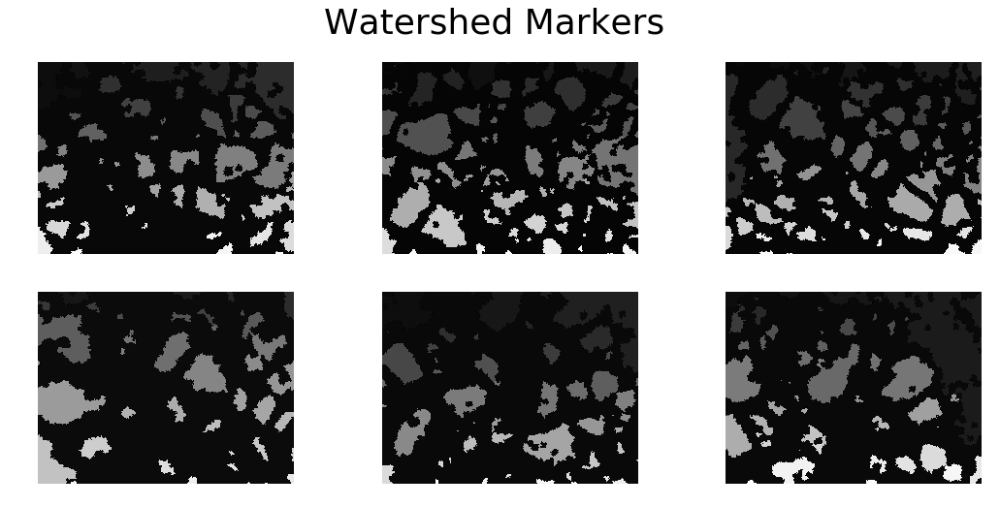

In [12]:
ws_markers, ws_imgs = watershed(set3_rgb, set3_gray_mask, thresh=.1)
display_imgs(ws_markers, width=3, height=2, title='Watershed Markers')
# display_imgs(ws_imgs, width=3, height=2, title='Original Images w/ WS Markers')

### Fit Ellipses Around Pebbles
For this step ellipses are being fit around the Watershed markers and drawn back onto the original image. Fitting the ellipse works only as well as the Watershed algorithm. Many of the problem in previous steps got propagated down to this step. The properties of all the ellipses were also found. Opencv returns the ellipse properties as ((x,y)(M1,M2),angle).

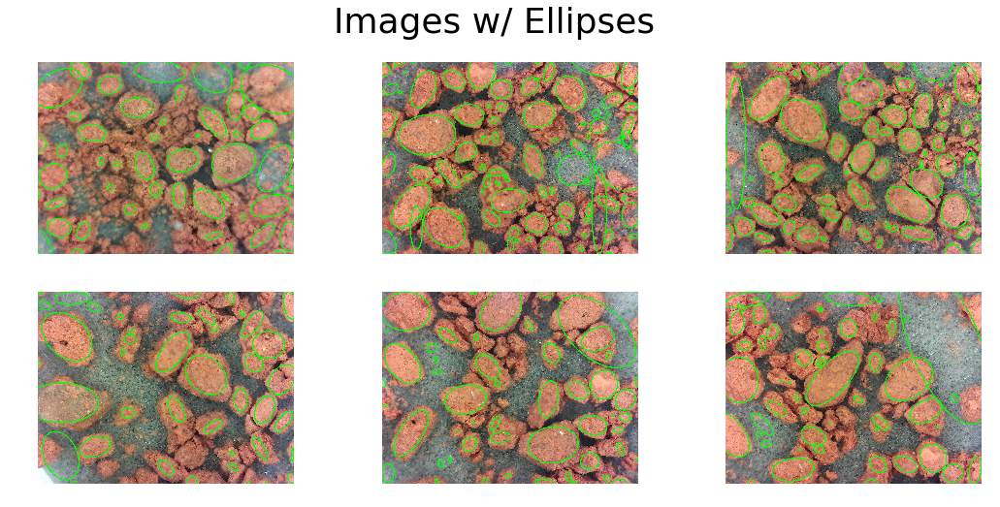

In [13]:
ellipses_imgs, all_ellipses_props = fit_ellipses(set3_rgb, ws_markers)
display_imgs(ellipses_imgs, width=3, height=2, title='Images w/ Ellipses')

## 6. Final Results
&emsp;
The final result was able to sketch an ellipse fairly well. Certain subsystems that worked especially well are the median filtering, erosion, and Watershed algorithm. Median filtering was very effective at removing the salt and pepper noise within the raw image. It was effective because the camera generate a lot of salt and pepper noise and median filters specialize in removing grainy noise in an image. Erosion was effective a separating out pebbles such that they don't overlap and get confused as one large pebble. Finally, Watershed worked well in conjunction with the previous steps as Watershed specializes in segmenting images given a image with a high contrast between foreground and background.

&emsp;
As one can notice there are still several false positive both small and large. The small false positive can be explained by the fact that there still remains some noise in the image that didn't get thresholded out. Average filtering and Gaussian filtering could have been used to remove these small pieces of noise but at a cost. As explained before reflections on the background gets mistaken for pebbles. Applying average or Gaussian filter to those area would only "smear" those reflections into the surrounding areas causing more problems. This ties back to the main weakness of this project which is poor preparing of the soil samples. The soil must be layered just right in order for this algorithm to identify pebbles accurately. 

### Find Size and Shape of Pebbles
#### Pebbel Size
&emsp;
The area of each pebble is calculated and plotted below. There are clear outliers towards both ends of the extreme which needs to be dealt with. How to deal with them will be discussed in future work. The histogram results are binned into 40 bins between 0 and 20000, linearly spaced.

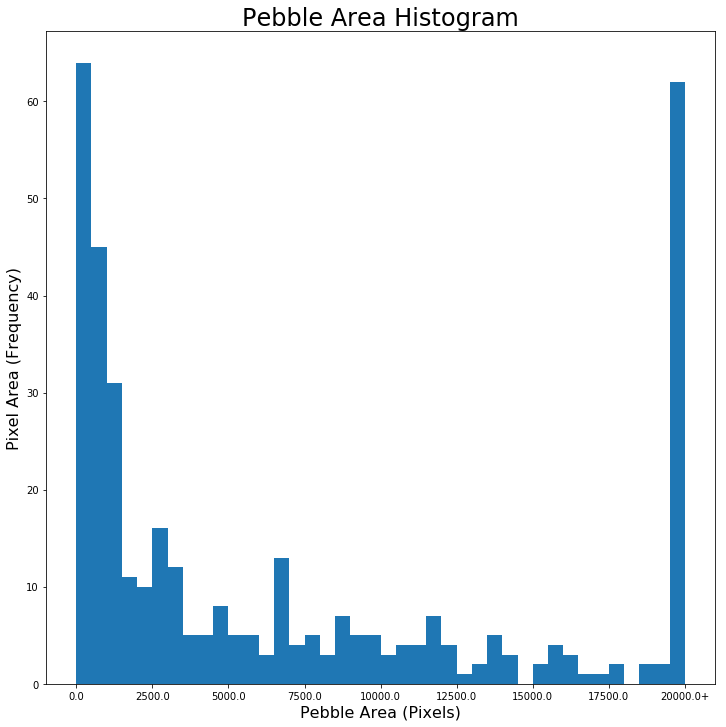

In [14]:
area_histogram(all_ellipses_props)

#### Pebbel Shape
&emsp;
The eccentricity of each pebble is calculated and plotted below. The histogram results are binned into 40 bins between 0 and 1, linearly spaced.

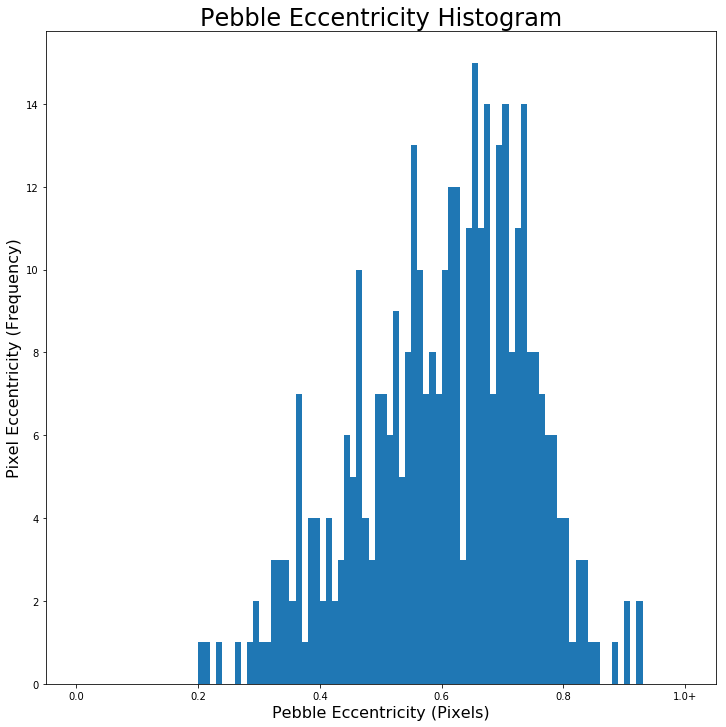

In [15]:
shape_histogram(all_ellipses_props)

### Analyze Data 
&emsp;
The main scope of this project is to create histograms of pebble size and shape. The analysis portion can be done if future works. Once more data is collected it can be analyzed for trends in the information. More details about data analysis will be discussed in the future work section.

## 7. Discussion and Future Work
&emsp;
Future features to include in this project:

    1) Creating a more user friendly application or GUI for tuning some parameters such as filtering, morphological, and watershed settings. This application should be able to process multiple images at a time and allow the user to view all of them as he or she is tuning parameters. Alternatively the user should be allowed to select an entire folder containing images and process all or most of them at once.
    2) Reduce the need for parameter tuning in general. The elegance of Otsu algorithm is that it able to automatically find mathematically optimal threshold. Ideally there should be almost no manually tuning of parameters and everything should be s dynamic as possible. If everything is dynamic then this script will scale better as datasets become large. The means that some effort should be focused on finding some algorithm for finding the optimal blur setting and opening and closing settings. 
    3) Find better ways to preprocess the data. Setting up the samples makes a huge difference. As mentioned in previous sections this algorithm works much better when the pebbles are presses against a dark background. Slight reflections in the background throws off the algorithm by causing it to mistake a reflection for a pebble. More work should be done to ensure this doesn't happen. Things that can be done includes improving the lighting or finding a darker less reflective material that is still sticky.
    4) Detecting false positive and false negatives. Looking at the histogram for ellipse size there are some clear outliers in the data. For example, there are multiple data points that exist in the upper and lower extremes of the histogram. These data points ought to be filtered out as they most likely represent either small bits of noise that weren't properly filtered out or reflections.
    5) Collect more data for analysis. Collect soil sample that had water flow and samples without. Compare and contrast the histograms of both datasets and look for patterns. Maybe even use some more advanced data science techniques to take a more scientific approach towards determining if there existed water flow.

&emsp;
In hindsight, focusing too much on manually tuning color thresholds was a waste of time and lead to poor results. In the end the easiest to implement solution, Otsu thresholding, lead to the best results. Instead, more time should have been spent better preparing the samples as a well prepared sample made image segmentation easiest and resulted in the least amount of false positives. On a final note, samples should have been gathered. However, collecting images was an incredibly time consuming and tedious process. The main goal of this project is to figure out what image processing tools work well and what doesn't work well. Scaling will be the subject of future semesters once the robotics teams has more manpower free time and manpower to gather samples to create a dataset.

&emsp;
In terms material, it is safe to say that this project already includes many subjects covered in class. On the other hand, other methods of filtering could have been used as filters other than median and Gaussian filters were not explored. When it comes to image segmentation, it would have been useful to take a look at other ways to segment the images. Image segmentation is at the core of this project and finding the best segmentation algorithm would have a large impact on this project. Finally, due to the fact that this project thresholds and isolates pebbles based on intensity, contrast stretching would have been a useful feature. Contrast stretching would have amplified the difference between the background and the pebbles this making the pebbles easier to detect.

## 8. References
[1]"MagniSci: Scientific image analysis simplified! Small applications directed for your microscopic tasks and analysis.", Magnisci.com, 2018. [Online]. Available: http://magnisci.com. [Accessed: 03- May- 2018].

[2]"Image Analysis Software | Materials | Life Science", MIPAR, 2018. [Online]. Available: http://www.mipar.us/. [Accessed: 03- May- 2018].

[3]"Fiji is just ImageJ", Fiji.sc, 2018. [Online]. Available: http://fiji.sc/. [Accessed: 03- May- 2018].

[4]"10 Applications for Particle Size Analysis - ATA Scientific", ATA Scientific, 2018. [Online]. Available: https://www.atascientific.com.au/10-applications-particle-size-analysis/. [Accessed: 03- May- 2018].

[5]R. Pedreros, H. Howa and D. Michel, "Application of grain size trend analysis for the determination of sediment transport pathways in intertidal areas", Marine Geology, vol. 135, no. 1-4, pp. 35-49, 1996.

[6]D. Bentz, E. Garboczi, C. Haecker and O. Jensen, "Effects of cement particle size distribution on performance properties of Portland cement-based materials", Cement and Concrete Research, vol. 29, no. 10, pp. 1663-1671, 1999.

[7]K. Naphade, "Soil characterization using digital image processing", Master of Science, Lehigh Univers, 1999.

[8]H. Ohm, "IMAGE-BASED SOIL PARTICLE SIZE AND SHAPE CHARACTERIZATION", Doctor of Philosophy, University of Michigan, 2018.

[9]"Ground Water Consortium", Gwconsortium.org, 2018. [Online]. Available: http://www.gwconsortium.org. [Accessed: 03- May- 2018].

[10]A. Rosebrock, "OpenCV panorama stitching - PyImageSearch", PyImageSearch, 2018. [Online]. Available: https://www.pyimagesearch.com/2016/01/11/opencv-panorama-stitching/. [Accessed: 03- May- 2018].

[11]"The Watershed Transformation page", Cmm.ensmp.fr, 2018. [Online]. Available: http://cmm.ensmp.fr/~beucher/wtshed.html. [Accessed: 03- May- 2018].

[12]A. Fitzgibbon and R. Fisher, "A Buyer's Guide to Conic Fitting", pp. 2-3, 1970.

## Appendix
#### Trackbar Helper Script
Here is a helper script that allows the user find good blurring and morphological transforms parameters.

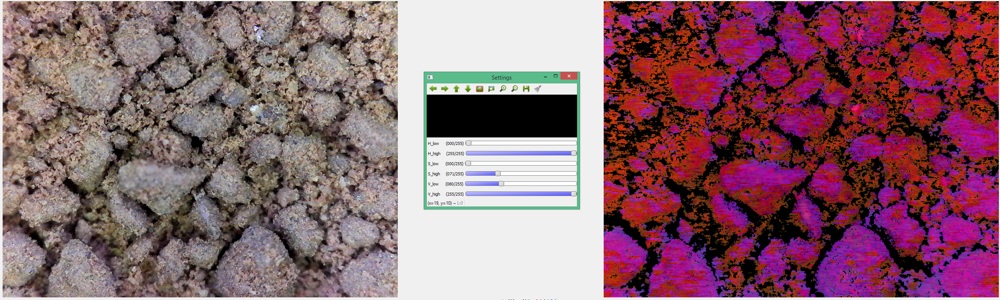

In [12]:
Image('Report/trackbar_script_demo.png')

Here is an demo of the scipt. The original image is on the left and a slidebar that can used to tune the parameters. The parts of the image that are filtered and thresholded out are changed to black.

#### Image Stitching
Additionally there exists an image stitching script which might prove useful for later **[10]**. If several images can be stitched together several images can be processed at once. Additionally, it reduces double counting of pebbles. Here are the results.

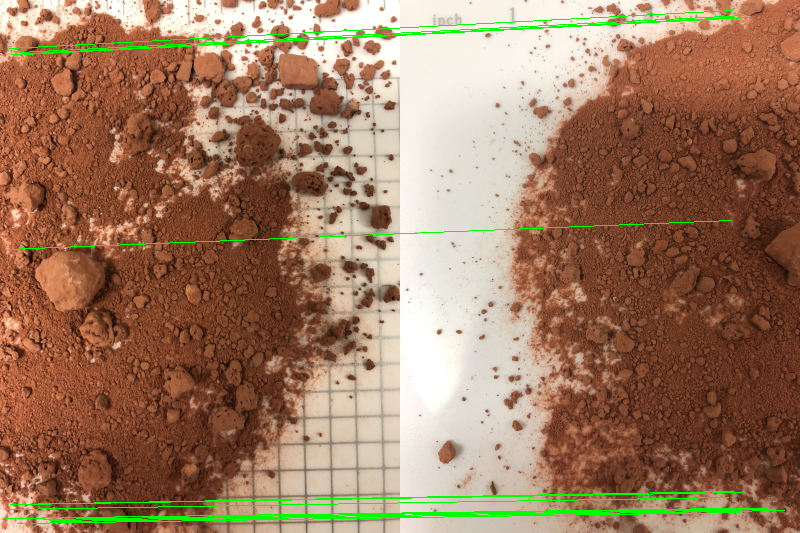

In [13]:
Image('Report/stitch2.png')

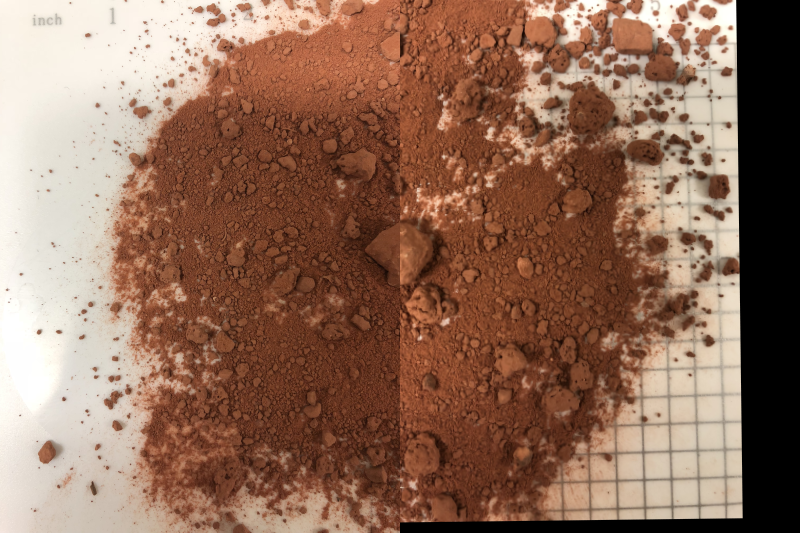

In [14]:
Image('Report/stitch1.png')